# Second Step: Topic Centroid vs. Human Readable Label Embedding Comparison

This notebook computes and visualizes the Euclidean Distance and Cosine Similarity between topic centroids and human-readable topic labels for the second-step clustering. The workflow includes:

1. **Data Preparation:** 
   - Loading two datasets: `Second_step_clustering_results_labelled_gpt_40.csv` and `Second_step_clustering_BERTopic_results.csv`.
   - Using Sentence Transformers to generate embeddings for both text centroids (from topic clusters) and human-readable topic labels.

2. **Distance and Similarity Calculations:**
   - Calculating pairwise Euclidean distances and Cosine similarities between topic centroids and corresponding human-readable labels.

3. **Statistics Generation:**
   - **Euclidean Distance:** Checking if the diagonal of the Euclidean distance matrix contains the minimum value for each row (indicating that the centroid and its corresponding label are the closest).
   - **Cosine Similarity:** Checking if the diagonal of the Cosine similarity matrix contains the maximum value for each row (indicating that the centroid and its corresponding label are the most similar).
   - Calculating the percentage of cases where the diagonal contains the minimum (Euclidean) or maximum (Cosine) value.
   - Computing the average diagonal value for both Euclidean distance and Cosine similarity.

4. **Visualization:**
   - Heatmaps are generated to visualize the pairwise Euclidean distances and Cosine similarities, allowing insight into the relationship between topics and their human-readable labels.



/home/yc656703/.local/lib/python3.9/site-packages/sentence_transformers/cross_encoder/CrossEncoder.py:11: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm, trange
/home/yc656703/.local/lib/python3.9/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


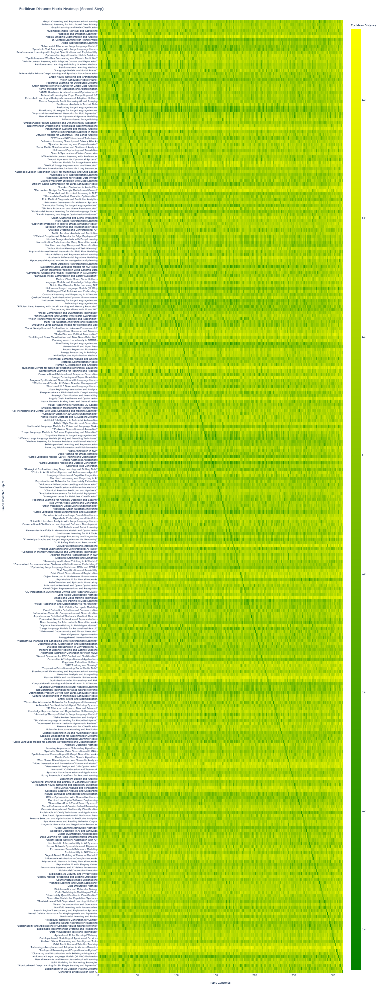

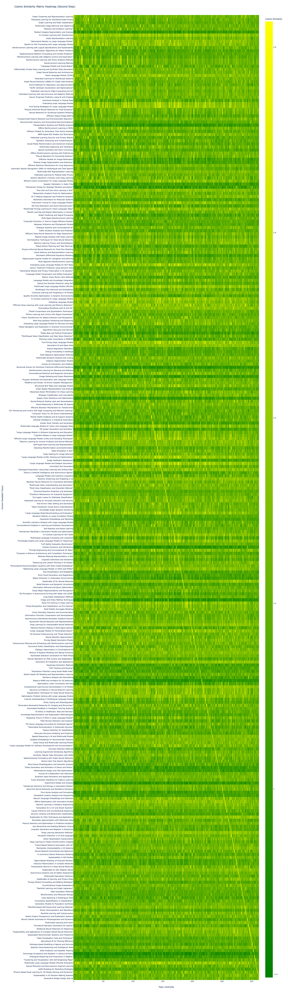

Percentage of cases where the diagonal has the minimum value for Euclidean distance: 72.20447284345049%
Percentage of cases where the diagonal has the maximum value for Cosine similarity: 72.84345047923323%
Average value on the diagonal for Euclidean distance: 0.7917668181486404
Average value on the diagonal for Cosine similarity: 0.610154187907807


In [1]:
import pandas as pd
from sentence_transformers import SentenceTransformer
import numpy as np
from sklearn.metrics.pairwise import euclidean_distances, cosine_similarity
import plotly.express as px
import plotly.io as pio

# Load the datasets
second_step = pd.read_csv('Second_step_clustering_results_labelled.csv')
bertopic_result = pd.read_csv('Second_step_clustering_BERTopic_results-Copy1.csv')

# Initialize the sentence transformer model
model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')

# Group by Topic and calculate centroids of text embeddings
grouped = bertopic_result.groupby('Topic Label')['text'].apply(list).reset_index()

def calculate_centroid(texts):
    embeddings = model.encode(texts)
    centroid = np.mean(embeddings, axis=0)
    return centroid

grouped['centroid'] = grouped['text'].apply(calculate_centroid)

# Calculate embeddings for Human_Readable_Topic in the second step dataset
second_step['Human_Readable_Topic'] = second_step['Human_Readable_Topic'].fillna("").astype(str)
second_step['Human_Readable_Topic_embedding'] = second_step['Human_Readable_Topic'].apply(lambda x: model.encode(x))

# Prepare to compare all centroids with all Human_Readable_Topic embeddings
centroids = grouped[['Topic Label', 'centroid']]
human_readable_embeddings = second_step[['Human_Readable_Topic', 'Human_Readable_Topic_embedding']]

# Use all rows, no exclusion
centroids_limited = centroids  # No exclusion, use all rows
human_readable_embeddings_limited = human_readable_embeddings  # No exclusion, use all rows

# Part 1: Euclidean Distance
# Initialize a matrix to store the pairwise Euclidean distances
euclidean_distance_matrix = np.zeros((len(human_readable_embeddings_limited), len(centroids_limited)))

# Calculate the Euclidean distance for each pair (Human Readable Topic vs. Topic Centroid)
for i, hr_embedding in enumerate(human_readable_embeddings_limited['Human_Readable_Topic_embedding']):
    for j, centroid in enumerate(centroids_limited['centroid']):
        distance = euclidean_distances([hr_embedding], [centroid])[0][0]
        euclidean_distance_matrix[i, j] = distance

# Convert the Euclidean distance matrix to a DataFrame
euclidean_df = pd.DataFrame(euclidean_distance_matrix, 
                            index=human_readable_embeddings_limited['Human_Readable_Topic'], 
                            columns=centroids_limited['Topic Label'])

# Save the Euclidean distance DataFrame to a CSV file
euclidean_df.to_csv('second_step_euclidean_distance_matrix.csv', index=True)

# Part 2: Cosine Similarity
# Initialize a matrix to store the pairwise cosine similarities
cosine_similarity_matrix = np.zeros((len(human_readable_embeddings_limited), len(centroids_limited)))

# Calculate the cosine similarity for each pair (Human Readable Topic vs. Topic Centroid)
for i, hr_embedding in enumerate(human_readable_embeddings_limited['Human_Readable_Topic_embedding']):
    for j, centroid in enumerate(centroids_limited['centroid']):
        similarity = cosine_similarity([hr_embedding], [centroid])[0][0]
        cosine_similarity_matrix[i, j] = similarity

# Convert the cosine similarity matrix to a DataFrame
cosine_df = pd.DataFrame(cosine_similarity_matrix, 
                         index=human_readable_embeddings_limited['Human_Readable_Topic'], 
                         columns=centroids_limited['Topic Label'])

# Save the cosine similarity DataFrame to a CSV file
cosine_df.to_csv('second_step_cosine_similarity_matrix.csv', index=True)

# Part 4: Visualization (Euclidean and Cosine)
# Euclidean Heatmap
fig_euclidean = px.imshow(euclidean_df,
                          labels=dict(x="Topic Centroids", y="Human Readable Topics", color="Euclidean Distance"),
                          x=euclidean_df.columns,
                          y=euclidean_df.index,
                          color_continuous_scale=['green', 'yellow'],  # Custom gradient from blue to yellow
                          text_auto=True)

fig_euclidean.update_layout(title='Euclidean Distance Matrix Heatmap (Second Step)',
                            xaxis_title='Topic Centroids',
                            yaxis_title='Human Readable Topics',
                            width=3000,  
                            height=3000,  
                            font=dict(size=7))  

# Save the Euclidean heatmap
pio.write_html(fig_euclidean, file='second_step_euclidean_heatmap.html', auto_open=False)
pio.write_image(fig_euclidean, file='second_step_euclidean_heatmap.png', format='png', width=2000, height=2000, scale=3)

# Cosine Heatmap
fig_cosine = px.imshow(cosine_df,
                       labels=dict(x="Topic Centroids", y="Human Readable Topics", color="Cosine Similarity"),
                       x=cosine_df.columns,
                       y=cosine_df.index,
                       color_continuous_scale=['green', 'yellow'],  # Custom gradient from blue to yellow
                       text_auto=True)

fig_cosine.update_layout(title='Cosine Similarity Matrix Heatmap (Second Step)',
                         xaxis_title='Topic Centroids',
                         yaxis_title='Human Readable Topics',
                         width=3000,  
                         height=4000,  
                         font=dict(size=7))  

# Save the Cosine heatmap
pio.write_html(fig_cosine, file='second_step_cosine_heatmap.html', auto_open=False)
pio.write_image(fig_cosine, file='second_step_cosine_heatmap.png', format='png', width=2000, height=2000, scale=3)

# Display the heatmaps
fig_euclidean.show()
fig_cosine.show()

# Statistics Generation
# Euclidean: The diagonal should have the minimum value (because it's distance)
diagonal_euclidean = np.diag(euclidean_distance_matrix)
min_in_rows_euclidean = np.min(euclidean_distance_matrix, axis=1)
diagonal_is_min_euclidean = np.sum(diagonal_euclidean == min_in_rows_euclidean)
euclidean_percentage = (diagonal_is_min_euclidean / len(diagonal_euclidean)) * 100
print(f"Percentage of cases where the diagonal has the minimum value for Euclidean distance: {euclidean_percentage}%")

# Cosine: The diagonal should have the maximum value (because it's similarity)
diagonal_cosine = np.diag(cosine_similarity_matrix)
max_in_rows_cosine = np.max(cosine_similarity_matrix, axis=1)
diagonal_is_max_cosine = np.sum(diagonal_cosine == max_in_rows_cosine)
cosine_percentage = (diagonal_is_max_cosine / len(diagonal_cosine)) * 100
print(f"Percentage of cases where the diagonal has the maximum value for Cosine similarity: {cosine_percentage}%")

# Part 4: Calculate the average value on the diagonal
# Euclidean: Calculate the average of the diagonal values (representing the average minimum distance)
average_euclidean_diagonal = np.mean(diagonal_euclidean)
print(f"Average value on the diagonal for Euclidean distance: {average_euclidean_diagonal}")

# Cosine: Calculate the average of the diagonal values (representing the average maximum similarity)
average_cosine_diagonal = np.mean(diagonal_cosine)
print(f"Average value on the diagonal for Cosine similarity: {average_cosine_diagonal}")
